<a href="https://colab.research.google.com/github/Lugiax/SudoSu_JusticIA/blob/main/SudoSu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

SudoSu se centrará en el reto 2 que consiste en proponer y desarrollar un algoritmo para la extracción de textos e identificación de personas, organizaciones, lugares y fechas de un conjunto de dos mil imágenes de fichas y expedientes de personas desaparecidas durante la llamada "guerra sucia". El algoritmo a desarrollar contemplará la preparación y preprocesamiento automatizado de las imágenes y la extracción de texto mediante un algoritmo de reconocimiento óptico de caracteres (OCR) y la identificación de personas, organizaciones, lugares y fechas a partir de técnicas de procesamiento de lenguaje natural (NLP).


Para este reto se propondrá un esquema de preprocesamiento para preparar las imágenes y extraer, mediante un algoritmo de reconocimiento óptico de caracteres (OCR), la mayor cantidad de información con el menor sesgo posible.

# Preparación de Drive y documentos

Primero debes asegurarte de haber agregado el enlace de los datos a tu drive en la raiz.
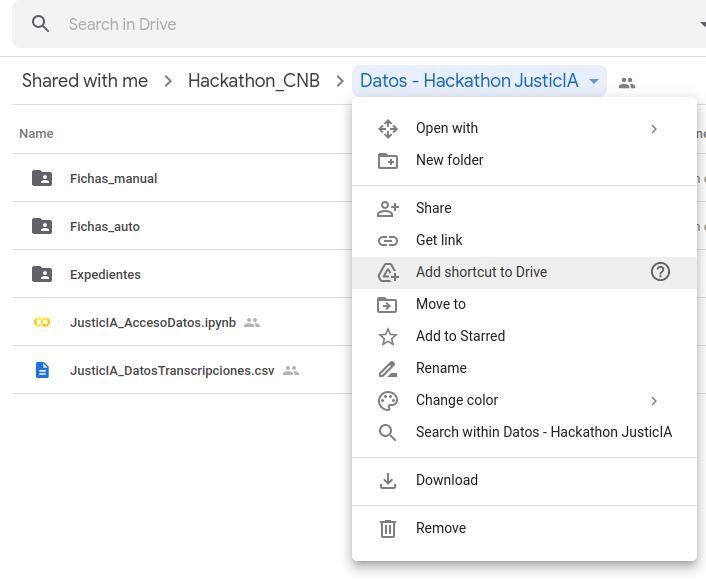

Despues de esto no queda más que activar el drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
## Cargar todos los archivos csv
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

ROOT = os.path.abspath('/content/drive/MyDrive/Datos - Hackathon JusticIA/')

df_trans = pd.read_csv(os.path.join(ROOT, 'JusticIA_DatosTranscripciones.csv'))

##Se agregan más columnas porque hay entradas con más de un valor válido
df_orgs = pd.read_csv(os.path.join(ROOT, 'organizations.csv'), names=[f'N{i}' for i in range(3)])
df_servs = pd.read_csv(os.path.join(ROOT, 'civilservants.csv'), names=[f'N{i}' for i in range(3)])
df_lugrs = pd.read_csv(os.path.join(ROOT, 'places.csv'), names=[f'N{i}' for i in range(3)])
df_prosc = pd.read_csv(os.path.join(ROOT, 'prosecuted.csv'), names=[f'N{i}' for i in range(2)])

df_trans.info()
df_trans['NombreArchivo'][200]

FileNotFoundError: ignored

In [ ]:
from PIL import Image
def open_idx(df, root_path, idx):
  file_name = df['NombreArchivo'][idx]
  folder = df['Conjunto'][idx]
  return Image.open(os.path.join(root_path, folder, file_name))

def show_image_in_plt(img):
    return plt.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

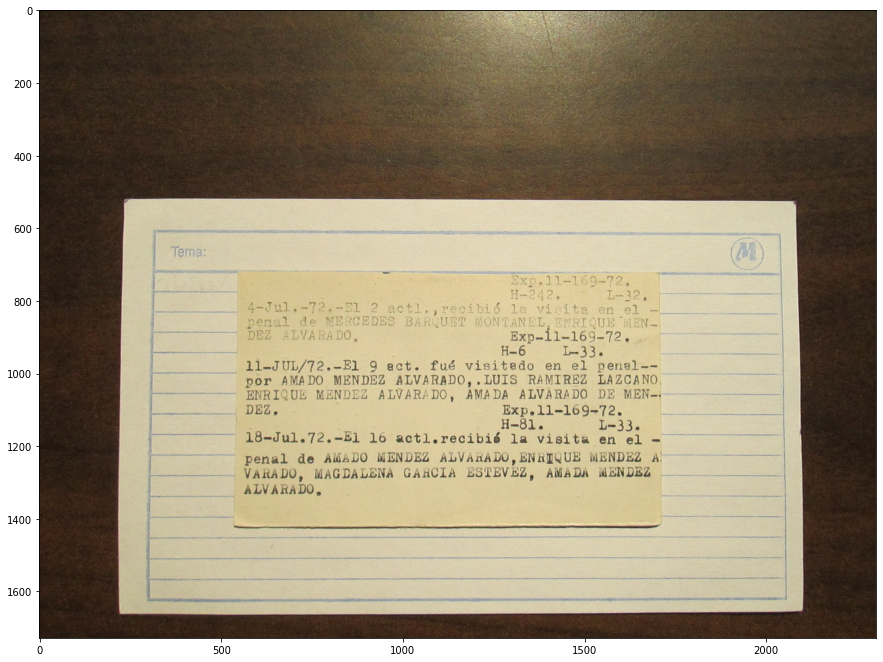

In [ ]:

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [15, 15]
plt.imshow(open_idx(df_trans, ROOT, 200))
plt.show()

# Parte 1 - Extracción de texto en imágenes

En esta parte se trabajará en la extracción de texto de las imágenes con [Tesseract](https://github.com/tesseract-ocr/tesseract). De igual forma nos podemos basar en la información que recapitulamos en este [documento](https://docs.google.com/document/d/1hXNyF13W2Ef_ks269F_y7MeJtySdpNadWcYN1qCE9Ok/edit?usp=sharing).

También será interesante revisar modelos ya pre entrenados en [tfHub](https://www.tensorflow.org/hub/).

In [ ]:
#Install tesseract engine and tesseract python API
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 40 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 2s (2,936 kB/s)
debconf: unable to initi

In [ ]:
import cv2
import pytesseract
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
img = np.array(open_idx(df_trans, ROOT, 200))
print(img.shape)

h_img, w_img, _ = img.shape

(1728, 2304, 3)


## Do some preprocessing over the images.

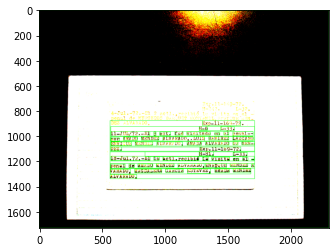

In [ ]:
ret, imgf = cv2.threshold(img, 128, 255,cv2.THRESH_BINARY,cv2.THRESH_OTSU) #imgf contains Binary image
plt.imshow(imgf)

In [ ]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_blurred = cv2.medianBlur(img_gray,5)
th2 = cv2.adaptiveThreshold(img_blurred,128,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(img_blurred,128,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

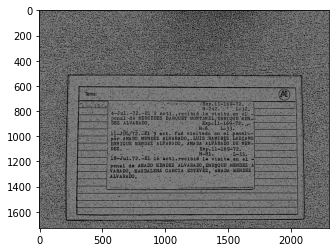

In [ ]:
show_image_in_plt(th2)

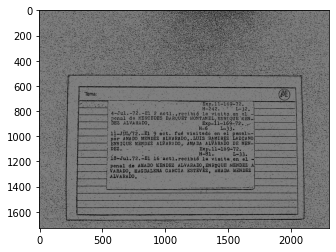

In [ ]:
show_image_in_plt(th3)

## Now let's try with tesseract-ocr

In [ ]:
boxes = pytesseract.image_to_data(img, output_type=pytesseract.Output.DICT)

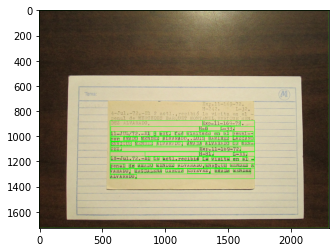

In [ ]:
n_boxes = len(boxes['level'])
for i in range(n_boxes):
    (x, y, w, h) = (boxes['left'][i], boxes['top'][i], boxes['width'][i], boxes['height'][i])
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

plt.imshow(img)

## Now let's try with keras OCR

In [ ]:
!pip install keras-ocr

     |████████████████████████████████| 57 kB 3.2 MB/s 
     |████████████████████████████████| 9.5 MB 10.4 MB/s 
     |████████████████████████████████| 870 kB 46.7 MB/s 
     |████████████████████████████████| 123 kB 71.7 MB/s 
     |████████████████████████████████| 50 kB 5.9 MB/s 
  Created wheel for keras-ocr: filename=keras_ocr-0.8.7-py3-none-any.whl size=43748 sha256=640763988bc0680c8bfe0a67dc1ec5d215838455a58f4d5b4099610ca54303a5
  Stored in directory: /root/.cache/pip/wheels/e4/e4/f3/05528293e01d7fa089343d5a5fd63dd07d79f57103fe9fc159
Successfully built keras-ocr


In [ ]:
import keras_ocr

In [ ]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [ ]:


images = [
   np.array(open_idx(200))
]


In [ ]:
prediction_groups = pipeline.recognize(images)

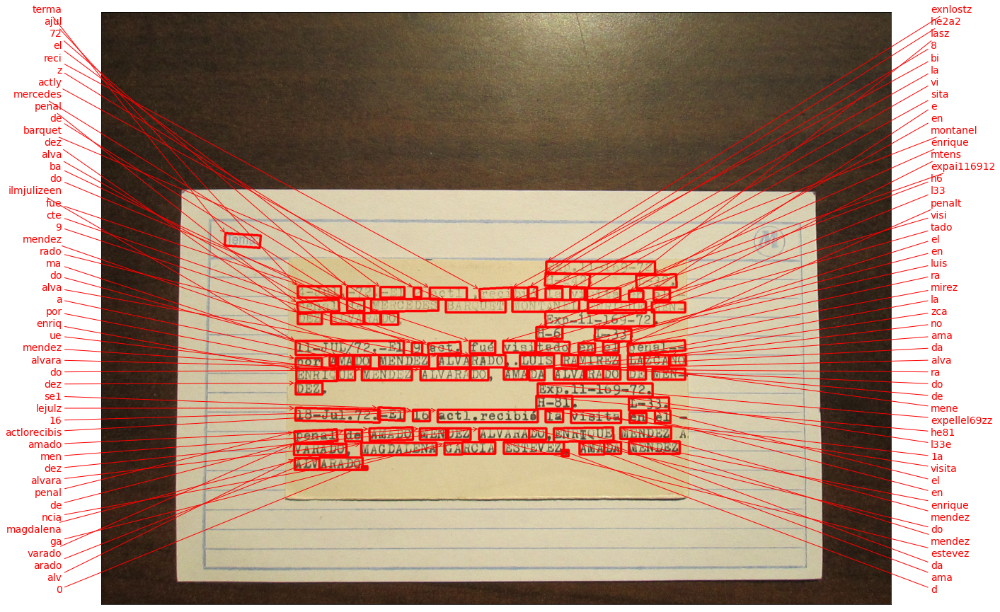

In [ ]:
fig, axs = plt.subplots(nrows=len(images), figsize=(20, 20))

for image, prediction in zip(images, prediction_groups):
    keras_ocr.tools.drawAnnotations(image=image, predictions=prediction, ax=axs)

# Parte 2 - Análisis de texto

En esta parte se hará el análisis del texto encontrado en las transcripciones por medio de NLP. Principalmente se planean utilizar [expresiones regulares](https://regexr.com/) para análisis simples y extracción de patrones en el texto. Para extraer información más importante como nombres de personas u organizaciones se puede utilizar [spaCy](https://spacy.io/), sobre todo la parte de [transfer learning](https://spacy.io/usage/embeddings-transformers).

In [ ]:
%%bash
pip install -U pip setuptools wheel
pip install -U spacy
python -m spacy download es_core_news_sm
clear

  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
  Attempting uninstall: catalogue
    Found existing installation: catalogue 1.0.0
    Uninstalling catalogue-1.0.0:
      Successfully uninstalled catalogue-1.0.0
  Attempting uninstall: srsly
    Found existing installation: srsly 1.0.5
    Uninstalling srsly-1.0.5:
      Successfully uninstalled srsly-1.0.5
  Attempting uninstall: thinc
    Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Attempting uninstall: spacy
    Found existing installation: spacy 2.2.4
    Uninstalling spacy-2.2.4:
      Successfully uninstalled spacy-2.2.4
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')


In [ ]:
def obtener_texto_idx(idx:int, df=None):
    """
    Devuelve el texto disponible en df_trans accesible por
    su índice. 
    """
    if df is None:
        df = df_trans
    return df.iloc[idx].Texto

def limpiar_1(texto:str):
    """
    Se hace una primera limpieza de los datos. Eliminando saltos de línea,
    y espacios innecesarios.
    """
    texto = texto.replace('\n', '')
    return texto

## Revisión manual de los datos
Para poder conocer mejor la información a la que nos afrontamos, es bueno hacer una revisión manual de cómo esta información se encuentra.


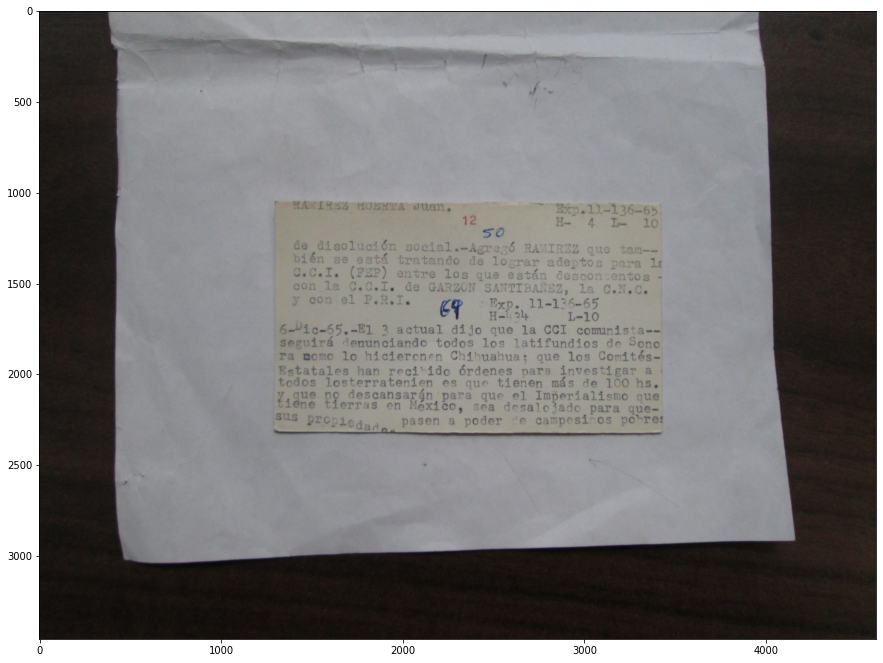

RAMIREZ HUERTA Juan. Exp.11-136-65
12 H- 4 L- 10
de disolución social.-Agregó RAMIREZ que tam- -
bién se está tratando de lograr adeptos para la
C.C.I. de GARZON SANTIBAÑEZ, la C.N.C. y con el P.R.I. Exp. 11-136-65
H-434 L-10
6-Dic-65.-El 3 actual dijo que la CCI comunista- -
seguirá denunciando todos los latifundios de Sono
ra como lo hicieronen Chihuahua; que los Comtés-
Estatales han recibido órdenes para investigar a
todos losterratenien es que tienen más de 100 hs.
y que no descansarán para que el Imperialismo que
tiene tierras en México, sea desalojado para que-
sus propiedades pasen a poder de campesinos pobres


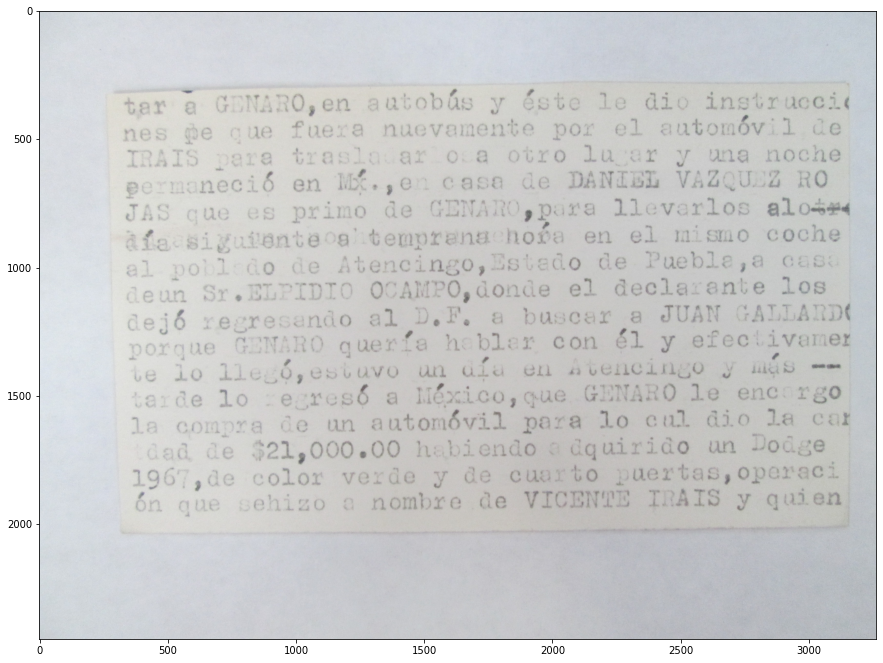

tar a GENARO,en autobús y éste le dio instruccio
nesde que fuera nuevamente por el automóvil de
IRAIS para trasladarlos a otro lugar y una noche
permaneció en Mx., en casa de DANIEL VAZQUEZ RO
JAS que es primo de GENARO, para llevarlos alo tro
día siguiente a temprana hora en el mismo coche
al poblado de Atencingo,Estado de Puebla, a casa deun Sr. ELPIDIO OCAMPO, donde el delcarante los
dejó regresando al D.F. a buscar a JUAN GALLARDO
porque GENARO quería hablar con él y efectivamen
te lo llegó, estuvo un día en Atencingo y más --
tarde lo regresó a México, que GENARO le encargo
la compra de un automóvil para lo cual le dio la can
tidad de $21,000.00 habiendo adquirido un Dodge 1967, de color verde y de cuatro puertas operaci
ón que sehizo a nombre de VICENTE IRAIS y quien


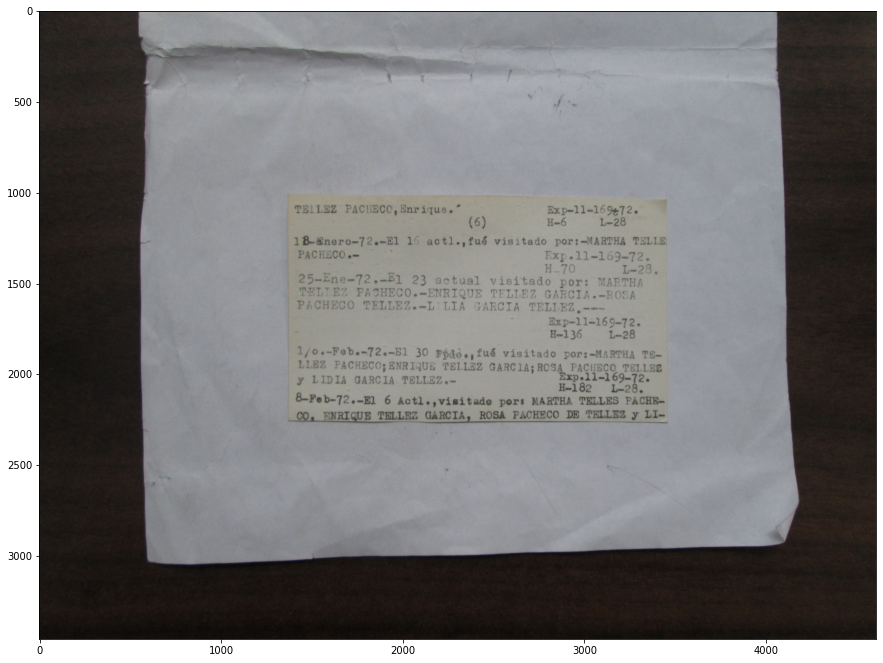

TELLEZ PACHECO. Enrique. Exp-11-169-72.
(6) H-6 L28
18-Enero-72.- El 16 actl., fue visitado por: MARTHA TELLE
PACHECO.- Exp- 11-169-72.
H-70 L-28.
25-Ene-72.-El 23 actual visitado por: MARTHA
TELLEZ PACHECO.- ENRIQUE TELLEZ GARCIA.- ROSA
PACHECO TELLEZ.- LILIA GARCIA TELLEZ.---
Exp-11-169-72.
H-136 L-28
1/°.-Feb.-72.-El 30 Ppdo., fué visitado por: MARTHA TE-
LLEZ PACHECO; ENRIQUE TELLEZ GARCIA; ROSA PACHECO TELLEZ
y LIDIA GARCIA TELLEZ.- Exp.11-169-72.
H-182 L-28.
8-Feb-72.-El 6 Actl., visitado por: MARTHA TELLES PACH-
CO. ENRIQUE TELLEZ GARCIA, ROSA PACHECO DE TELLEZ y LI-


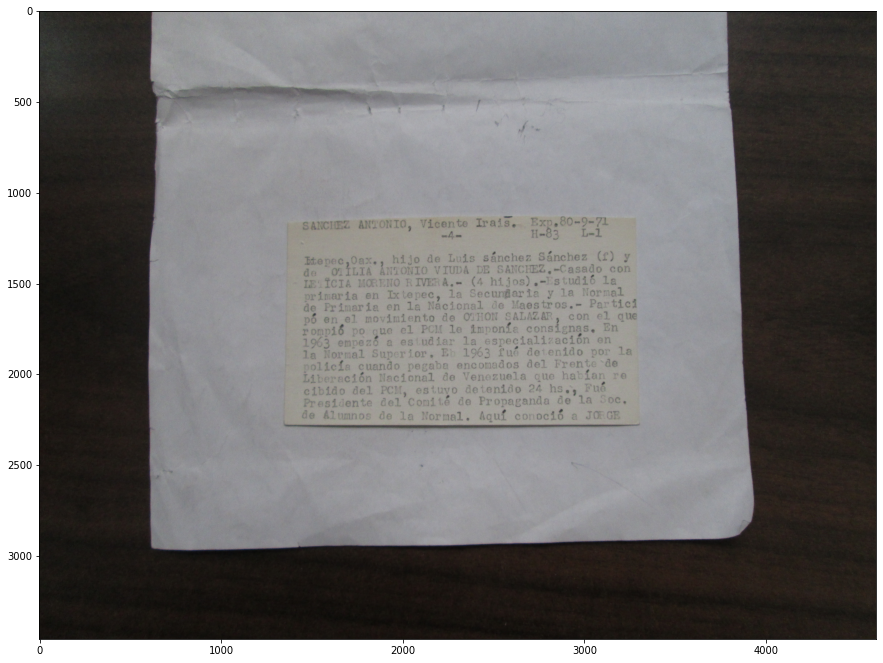

SANCHEZ ANTONIO, Vicente Irais. Exp.80-9-71
-4- H-83 L-1
Itepec,Oax., hijo de Luis sánchez Sánchez (f) y
de OTILIA ANTONIO VIUDA DE SANCHEZ.-Casado con
LETICIA MORENO RIVERA.- (4 hijos) .-Estudió la
primaria en Ixtepec, la Secundaria y la Normal
de Primaria en la Nacional de Maestros.- Partici
pó en el movimiento de OTHON SALAZAR, con el que
rompió po que el PCM le imponía consignas. En
1963 empezó a estudiar la especialización en
la Normal Superior. En 1963 fué detenido por la
policía cuando pegaba encomados del Frente de
Liberación Nacional de Venezuela que habían re
cibido del PCM, estuvo detenido 24 hs., Fué
Presidente del Comité de Propaganda de la Soc.
de Alumnos de la Normal. Aquí conoció a JORGE


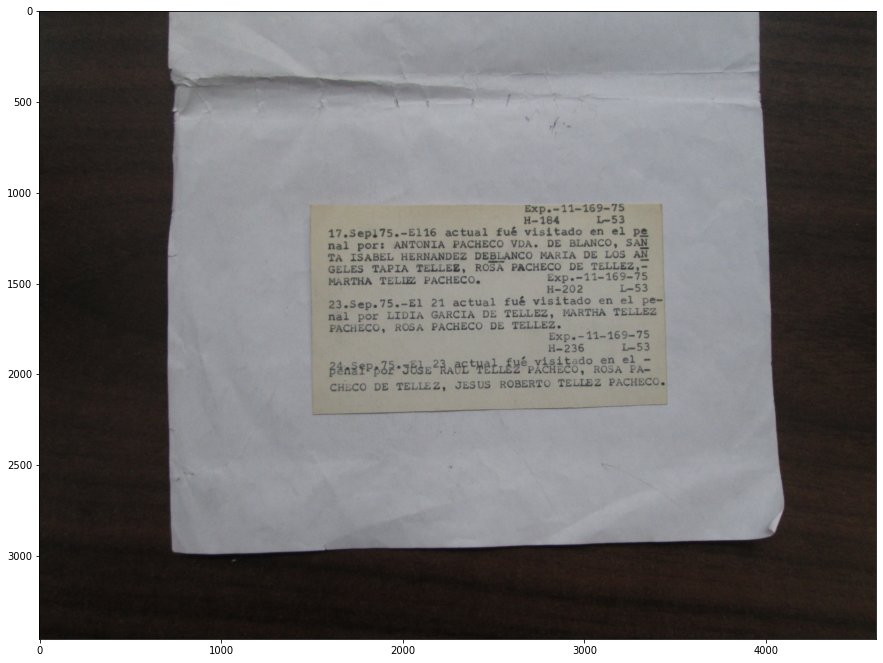

Exp.-11-169-75
H-184 L-53
17.Sep.75.-El actual fué visitado en el pe
nal por: ANTONIA PACHECO VDA. DE BLANCO, SAN
TA ISABEL HERNANDEZ DEBLANCO MARIA DE LOS AN
GELES TAPIA TELLEZ, ROSA PACHECO DE TELLEZ,-
MATHA TELLEZ PACHECO. Exp.-11-169-75
H-202 L-53
23.Sep.75.-El 21 actual fué visitado en el pe-
nal por LIDIA GARCIA DE TELLEZ, MARTHA TELLEZ PACHECO, ROSA PACHECO DE TELLEZ.
Exp.-11-169-75
H-236 L-53
24.Sep.75.-El 23 actual fué visitado en el -
penal por JOSE RAUL TELLEZ PACHECO, ROSA PA-
CHECO DE TELLEZ, JESUS ROBERTO TELLEZ PACHECO.


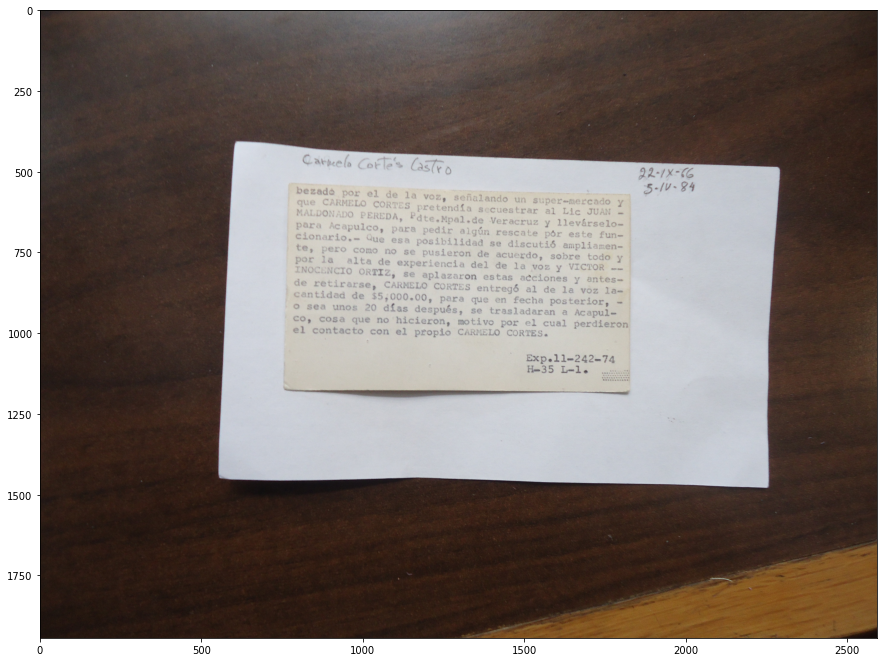

bezado por el de la voz, señalando un super-mercado y que CARMELO CORTES pretendía secuestrar al Lic JUAN -
MALDONADO PEREDA, Pdte.Mpal.de Veracruz y llevárselo-
para Acapulco, para pedir algún rescate por este fun-
cionario.-
Que esa posibilidad se discutió ampliamen-
te, pero como no se pusieron de acuerdo, sobre todo y
por la alta de experiencia del de la voz y VICTOR - -
INOCENCIO ORTIZ, se aplazaron estas acciones y antes-
de retirarse, CARMELO CORTES entregó al de la voz la-
cantidad de $5,000.00, para que en fecha posterior, -
o sea unos 20 días después, se trasladaran a Acapul-
co, cosa que no hicieron, motivo por el cual perdieron
el contacto con el propio CARMELO CORTES.
Exp.11-242-74
H-35 L-1.


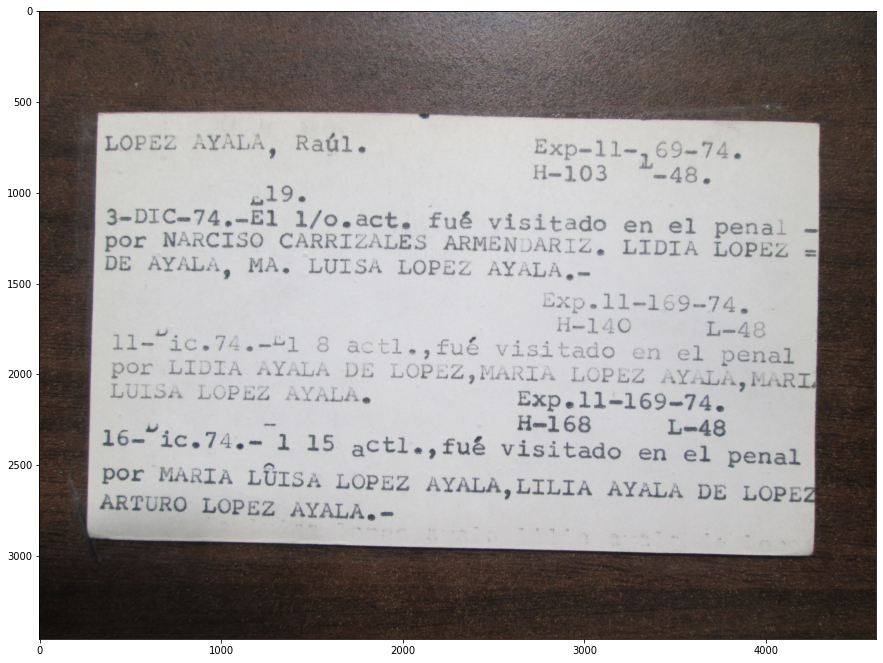

LOPEZ AYALA, Raúl. Exp-11-169-74.
H-103 L-48.
E19
3-DIC-74.-El 1/o.act. Fue visitado en el penal -
por NARCISO CARRIZALES ARMENDARIZ. LIDIA LOPEZ=
DE AYALA, Ma. LUISA LOPEZ AYALA.-
Exp.11-169-74.
H-140 L-48
11-Dic.74..- El 8 actl., fué visitado en el penal
por LIDIA AYALA DE LOPEZ,MARIA LOPEZ AYALA,MARIA
LUISA LOPEZ AYALA. Exp.11-169-74.
H-168 L-48
16-Dic.74.-EL 15 actl.,fué visitado en el penal
por MARIA LUISA LOPEZ AYALA,LILIA AYALA DE LOPEZ
ARTURO LOPEZ AYALA.-


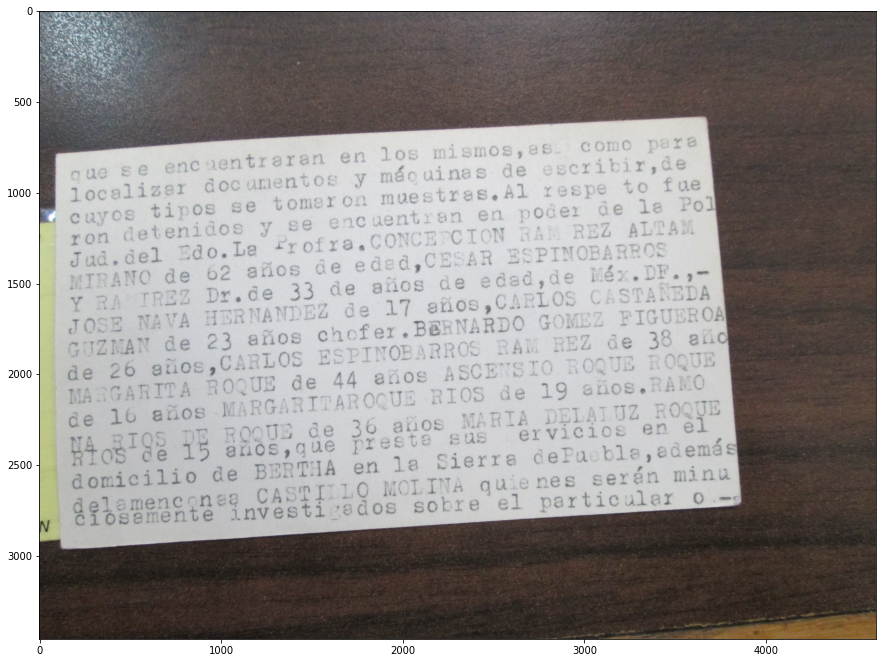

que se encuentraran en los mismos, as como para
localiar documentos y máquinas de escribir, de
cuyos tipos se tomaron muestras.Al res to fue
ron detenidos y se encuentran en poder de la Pol
Jud.del Edo. La Profra. CONCEPCION RAMIREZ ALTAM
MIRANO DE 62 años de edad, CESAR ESPINOBARROS
Y RAMIREZ Dr. de 33 años de edad, de Méx.DF.,-
JOSE NAVA HERNANDEZ de 17 años, CARLOS CASTAÑEDA
GUZMAN de 23 años chofer. BERNANDO GOMEZ FIGUEROA
de 26 años, CARLOS ESPINOBARROS RAMIREZ de 38 año
MARGARITA ROQUE de 44 años ASCENCIO ROQUE ROQUE
de 16 años MARGARITAROQUE RIOS de 19 años. RAMO
NA RIOS DE ROQUE de 36 años MARIA DELALUZ ROQUE
RIOS de 15 años, que presta sus ervicios en el
domicilio de BERTHA en la Sierra dePuebla, además
delamencionaa CASTILLO MOLINA quienes será minu
ciosamente investigados sobre el particular o -


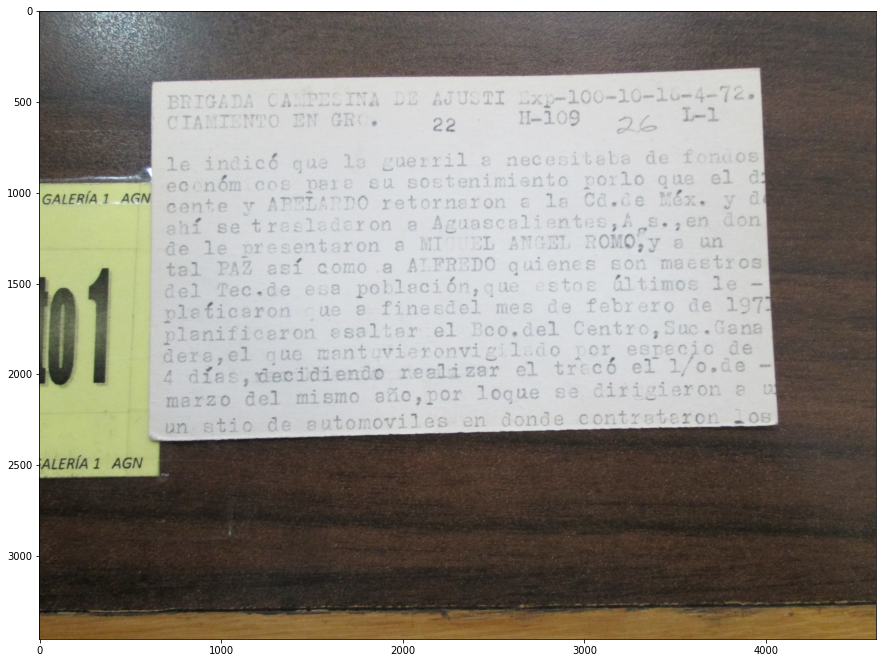

BRIGADA CAMPESINA DE AJUSTI Exp-100-10-16-4-72.
CIAMENTO EN GRO. -22- H-109 L-1
le indicó que la guerrilla necesitaba de fondos
económicos para su sostenimiento porlo que el d
cente y ABELARDO retornaron a la Cd.de Méx.y d
ahí se trasladaron a Aguascalientes, Ags., en don
de le presentaron a MIGUEL ANGEL ROMO, y a un
tal PAZ así como a ALFREDO quienes son maestros
del Tec. de esa población, que estos últimos le -
platicaron que a finesdel mes de febrero de 197
planificaron asaltar el Bco.del centro, Suc. Gana
dera, el que mantuvieronvigilado por espacio de
4 días, decidiendo realizar el traco el 1/o. de -
marzo del mismo año, por loque se dirigieron a u
un sitio de automoviles en donde contrataron los


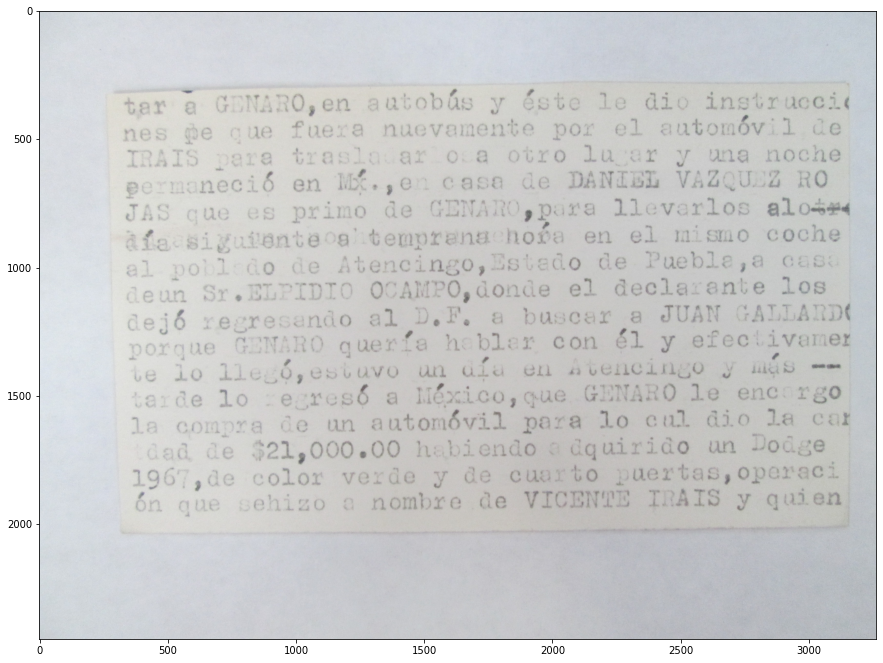

tar a GENARO,en autobús y éste le dio instruccio
nesde que fuera nuevamente por el automóvil de
IRAIS para trasladarlos a otro lugar y una noche
permaneció en Mx., en casa de DANIEL VAZQUEZ RO
JAS que es primo de GENARO, para llevarlos alo tro
día siguiente a temprana hora en el mismo coche
al poblado de Atencingo,Estado de Puebla, a casa deun Sr. ELPIDIO OCAMPO, donde el delcarante los
dejó regresando al D.F. a buscar a JUAN GALLARDO
porque GENARO quería hablar con él y efectivamen
te lo llegó, estuvo un día en Atencingo y más --
tarde lo regresó a México, que GENARO le encargo
la compra de un automóvil para lo cual le dio la can
tidad de $21,000.00 habiendo adquirido un Dodge 1967, de color verde y de cuatro puertas operaci
ón que sehizo a nombre de VICENTE IRAIS y quien


In [ ]:
##Revisar solo las transcripciones manuales idx de 0-999
df = df_trans[df_trans.MetodoTexto=='manual']
for idx in np.random.randint(100, size=10):
    texto = obtener_texto_idx(idx, df)
    #texto =limpiar_1(texto)
    plt.figure(figsize=(15,13))
    plt.imshow(np.array(open_idx(idx)))
    plt.show()
    print(texto)

**OBSERVACIONES**

* Generalmente las fichas inician con un nombre. Este nombre puede ser el de una persona o de una organización.
* Generalmente se encuentran en la parte superior derecha el número de expediente, comenzando con la palabra Exp y una serie de números y separadores (como - /).
* Debajo de cada número de expediente se encuentran dos identificadores H y L. ambos son seguidos de un número y pueden ser diferentes dentro del mismo expediente.
* Después de definir el expediente y los identificadores, viene un texto que en algunas veces comienza con una fecha en el formato r'\d{1,2}[/.-]\w+[/.-]\d{1,2}* En el texto muchas veces hay palabras que se cortan en el salto de línea, y no utiilzan el -.
* Por lo general, los nombres de personas y de organizaciones están escritos en mayúsculas.

## Pruebas de limpieza de los textos

In [ ]:
import regex as re
##Revisar solo las transcripciones manuales idx de 0-999
df = df_trans[df_trans.MetodoTexto=='manual']
for idx in np.random.randint(100, size=1):# 6     100  37  81  34 27 
    texto = obtener_texto_idx(idx, df)
    #plt.figure(figsize=(15,13))
    #plt.imshow(np.array(open_idx(idx)))
    #plt.show()
    nombre_expediente = ''
    if re.match(r'(([A-Z]+\s*)+)', texto) is not None: #Se busca el encabezado 
        nombre_expediente = matches.groups()[0]

    #print(texto, end='\n\n')
    texto = re.sub(r'([A-Z]+)[-—\s]*\n[-—\s]*([A-Z]+)', 
                   r'\1\2',
                   texto)
    
    nombres = [f[0].strip().replace('.', '') for f in re.findall(r'(([\p{Lu}\.]{2,}\s?)+)', texto)]
    print(idx)
    print(texto)
    print(nombres)

67
que se encuentraran en los mismos, as como para
localiar documentos y máquinas de escribir, de
cuyos tipos se tomaron muestras.Al res to fue
ron detenidos y se encuentran en poder de la Pol
Jud.del Edo. La Profra. CONCEPCION RAMIREZ ALTAMMIRANO DE 62 años de edad, CESAR ESPINOBARROSY RAMIREZ Dr. de 33 años de edad, de Méx.DF.,-
JOSE NAVA HERNANDEZ de 17 años, CARLOS CASTAÑEDAGUZMAN de 23 años chofer. BERNANDO GOMEZ FIGUEROA
de 26 años, CARLOS ESPINOBARROS RAMIREZ de 38 año
MARGARITA ROQUE de 44 años ASCENCIO ROQUE ROQUE
de 16 años MARGARITAROQUE RIOS de 19 años. RAMONA RIOS DE ROQUE de 36 años MARIA DELALUZ ROQUERIOS de 15 años, que presta sus ervicios en el
domicilio de BERTHA en la Sierra dePuebla, además
delamencionaa CASTILLO MOLINA quienes será minu
ciosamente investigados sobre el particular o -
['A', 'CONCEPCION RAMIREZ ALTAMMIRANO DE', 'CESAR ESPINOBARROSY RAMIREZ', 'DF', 'JOSE NAVA HERNANDEZ', 'CARLOS CASTAÑEDAGUZMAN', 'BERNANDO GOMEZ FIGUEROA', 'CARLOS ESPINOBARROS RAMIREZ

In [ ]:
import spacy

nlp = spacy.load('es_core_news_sm')
df = df_trans[df_trans.MetodoTexto=='manual']
for idx in np.random.randint(100, size=1):# 6     100  37  81  34 27 
    texto = obtener_texto_idx(idx, df)
    texto = re.sub(r'([A-Z]+)[-—\s]*\n[-—\s]*([A-Z]+)', 
                   r'\1\2',
                   texto)
    print(texto, end='\n\n')
    doc = nlp(texto.lower())
    for ent in doc.ents:
        if ent.label_ == 'PER':print(ent.text, ent.label_)

Exp.-11-169-75
H-184 L-53
17.Sep.75.-El actual fué visitado en el pe
nal por: ANTONIA PACHECO VDA. DE BLANCO, SANTA ISABEL HERNANDEZ DEBLANCO MARIA DE LOS ANGELES TAPIA TELLEZ, ROSA PACHECO DE TELLEZ,-
MATHA TELLEZ PACHECO. Exp.-11-169-75
H-202 L-53
23.Sep.75.-El 21 actual fué visitado en el pe-
nal por LIDIA GARCIA DE TELLEZ, MARTHA TELLEZ PACHECO, ROSA PACHECO DE TELLEZ.
Exp.-11-169-75
H-236 L-53
24.Sep.75.-El 23 actual fué visitado en el -
penal por JOSE RAUL TELLEZ PACHECO, ROSA PACHECO DE TELLEZ, JESUS ROBERTO TELLEZ PACHECO.

antonia pacheco vda PER
santa isabel hernandez deblanco maria de los angeles tapia tellez PER
rosa pacheco PER
tellez,- PER
matha tellez pacheco PER
martha tellez pacheco PER
rosa pacheco de tellez PER
pacheco PER
rosa pacheco de tellez PER
roberto tellez pacheco PER
